In [ ]:
from __future__ import annotations
import numpy as np
import pandas as pd
from pathlib import Path
from sklearn.cross_decomposition import CCA
from scipy.stats import pearsonr 
from scipy import stats

###############################################################################
# Paths & constants
###############################################################################
PUPIL_ROOT = Path(r"C:\Users\cdd\Documents\Uni\Special_course\pupil_fast")
EEG_ROOT   = Path(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\eeg_fast")

FRONTAL_MIDLINE = ['AFz','AF3','AF4','Fz','F1','F2','F3','F4','FC3','FC1','FC2','FC4','Cz','C3','C1','C2','C4']

OUT_TRIALS  = Path("trial_level_cca_fast.csv")
OUT_SUBJECT = Path("subject_level_cca_fast.csv")
OUT_WEIGHTS = Path("cca_weights_fast")

SUBJECTS = np.setdiff1d(np.arange(32, 63), [32, 37, 53, 61, 66, 78, 84, 90, 94, 96])
#SUBJECTS = np.setdiff1d(np.arange(32, 99), [32, 37, 53, 61, 66, 78, 84, 90, 94, 96])
SHIFTS = np.arange(-100, 101)      # ±1 s at 100 Hz → samples
WIN_OFFSET1 = 200                  # discard first 200 ms
WIN_OFFSET2 = 101                  # discard last 110 ms

###############################################################################
# Helper functions
###############################################################################

def normalise_eeg(x: np.ndarray) -> np.ndarray:
    """Centre each channel and scale so Σ x² = 1 over time×channels."""
    x = x - x.mean(axis=0, keepdims=True)
    scale = np.sqrt(np.mean(x**2))
    return x / scale


def cca_corr(eeg: np.ndarray, pupil: np.ndarray) -> float:
    """Canonical correlation (single component)."""
    cca = CCA(n_components=1, max_iter=1000, scale=False, tol=1e-6)
    cca.fit(eeg, pupil)
    u, v = cca.transform(eeg, pupil)
    return float(np.corrcoef(u[:, 0], v[:, 0])[0, 1])

def candidate_lags_units(step_ms=100, max_ms=1000):
    # Your code uses 10 ms units (lag_ms = shift*10)
    step_units = step_ms // 10
    max_units  = max_ms  // 10
    return list(range(-max_units, max_units + 1, step_units))


In [2]:
def load_all_trials(
        sub: int,
        eeg_root: Path = EEG_ROOT,
        pupil_root: Path = PUPIL_ROOT,
        min_len: int = 40,
        max_len_diff: int = 30,
) -> list[tuple[np.ndarray, np.ndarray, dict]]:
    """
    Load *all* valid EEG-pupil trial pairs for one subject.

    Parameters
    ----------
    sub : int
        Numeric subject ID (e.g. 42).
    eeg_root, pupil_root : Path
        Roots of the pre-processed EEG and pupil folders.
    min_len : int
        Minimum number of samples a pupil trace must have to be accepted.
    max_len_diff : int
        Reject trial if |len(pupil)-len(eeg)| exceeds this.
    Returns
    -------
    trials : list of (eeg, pupil_z, meta)
        * eeg        - (T × n_channels) float64, already centred/scaled
        * pupil_z    - (T × 1) float64, per-trial z-scored
        * meta       - dict with subject/condition/load/epoch
    """
    trials = []
    sub_tag = f"sub-{sub:03d}"
    eeg_sub  = eeg_root   / sub_tag
    pupil_sub = pupil_root / sub_tag

    if not eeg_sub.exists():
        print(f"{sub_tag}: EEG folder missing - skipped")
        return trials

    # iterate condition (“control” / “memory”) and load (“05” / “09” / “13”)
    for cond_path in sorted(eeg_sub.iterdir()):
        if not cond_path.is_dir():
            continue
        for load_path in sorted(cond_path.iterdir()):
            if not load_path.is_dir():
                continue

            # matching pupil directory
            pupil_path = pupil_sub / cond_path.name / load_path.name
            if not pupil_path.exists():
                continue

            eeg_epochs   = sorted(load_path.glob("trial_*.csv"))
            pupil_epochs = sorted(pupil_path.glob("trial_*.csv"))
            common = {f.name for f in eeg_epochs} & {f.name for f in pupil_epochs}
            if not common:
                continue

            for fname in sorted(common):
                eeg_df = pd.read_csv(load_path / fname, comment="#", index_col=0)
                pupil_df = pd.read_csv(pupil_path / fname, comment="#", skiprows=1,
                                       names=["time", "diameter_z"], index_col=0)

                eeg   = eeg_df.values.astype(float)
                pupil = pupil_df["diameter_z"].values.astype(float)

                # basic validity checks
                if len(pupil) < min_len or abs(len(pupil) - len(eeg)) > max_len_diff:
                    continue

                # normalise signals ----------------------------------------
                eeg_norm = normalise_eeg(eeg)           # your helper from before
                pupil_z  = ((pupil - pupil.mean()) / pupil.std(ddof=0))

                # same number of samples
                T = min(len(eeg_norm), len(pupil_z))
                eeg_norm = eeg_norm[0:T, :]  # (T × n_channels)
                pupil_z  = pupil_z[0:T].reshape(-1, 1)

                meta = {
                    "subject":   sub_tag,
                    "condition": cond_path.name,
                    "load":      int(load_path.name),
                    "epoch":     fname
                }
                trials.append((eeg_norm, pupil_z, meta))

    return trials

from typing import List, Tuple
import numpy as np

def split_trials_by_condition(
        trials: List[Tuple[np.ndarray, np.ndarray, dict]],
        memory_label: str = "memory",
        control_label: str = "control"
) -> Tuple[List[Tuple[np.ndarray, np.ndarray, dict]], List[Tuple[np.ndarray, np.ndarray, dict]]]:
    """
    Separate a mixed list of (eeg, pupil, meta) trial tuples into memory-condition and control-condition sub-lists.

    Parameters
    ----------
    trials : list of tuples
        Each tuple = (eeg_array, pupil_array, meta_dict).
        meta_dict must contain a key 'condition'.
    memory_label : str
        The value of meta['condition'] that marks a memory trial.
    control_label : str
        The value of meta['condition'] that marks a control trial.

    Returns
    -------
    memory_trials  : list[tuple]
    control_trials : list[tuple]
    """
    memory_trials  = []
    control_trials = []

    for eeg, pupil, meta in trials:
        cond = meta.get("condition", "").lower()
        if cond == memory_label:
            memory_trials.append((eeg, pupil, meta))
        elif cond == control_label:
            control_trials.append((eeg, pupil, meta))
        else: raise ValueError(f"Unknown condition label: {cond}")

    return memory_trials, control_trials


In [ ]:

from typing import List, Tuple, Optional, Dict

# trials  : list of (eeg, pupil_z, meta)   -- the tuples returned by load_all_trials
# shift   : integer sample shift (best_shift)
# win     : slice or None                  -- cropping window (set to None if the
#                                            trials are already pre-trimmed)
def concat_trials(
        trials: List[Tuple[np.ndarray, np.ndarray, dict]],
        shift: int = 0
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Concatenate a list of trials into one long matrix pair ready for CCA.

    Returns
    -------
    X  : ndarray, shape (Σ Tᵢ, n_channels)
    Y  : ndarray, shape (Σ Tᵢ, 1)
    """
    X_blocks, Y_blocks = [], []

    for eeg, pupil_z, _ in trials:
        # 1. roll *inside* the trial so samples never cross trial boundaries
        eeg_shift = np.roll(eeg, shift, axis=0)

        # 2. optional windowing (do it once here if you did **not** crop in loader)
        win = slice(WIN_OFFSET1, -WIN_OFFSET2)  # common window
        if shift > WIN_OFFSET1:
            win = slice(shift, -WIN_OFFSET2)
        if shift < -WIN_OFFSET2:
            win = slice(WIN_OFFSET1, shift)

        eeg_shift = eeg_shift[win]
        pupil_seg = pupil_z[win]


        # 3. stack
        X_blocks.append(eeg_shift)
        Y_blocks.append(pupil_seg)

    X = np.vstack(X_blocks)
    Y = np.vstack(Y_blocks)
    return X, Y

def iterate_trials(trials, shift):
    """Yield (eeg_shifted, pupil_z_windowed, meta) one by one."""
    win = slice(WIN_OFFSET1, -WIN_OFFSET2)  # common window
    if shift > WIN_OFFSET1:
        win = slice(shift, -WIN_OFFSET2)
    if shift < -WIN_OFFSET2:
        win = slice(WIN_OFFSET1, shift)

    for eeg, pupil_z, meta in trials:
        eeg_s = np.roll(eeg, shift, axis=0)[win]
        yield eeg_s, pupil_z[win], meta.copy()

import pandas as pd
import json
from pathlib import Path

def save_cca_weights(cca, subject_tag, lag_ms, eeg_ch_names, condition, out_dir=Path("weights")):
    """
    Dump EEG & pupil canonical weights to CSV/JSON for one subject.

    Parameters
    ----------
    cca            : fitted sklearn.cross_decomposition.CCA
    subject_tag    : "sub-042"
    lag_ms         : e.g. -90
    eeg_ch_names   : list[str] same order as columns in your trial matrices
    out_dir        : destination folder (created if missing)
    """
    out_dir.mkdir(parents=True, exist_ok=True)

    # ------- Pupil weight -> JSON ---------------------------------------
    w_pupil_og = float(cca.y_weights_[0, 0])   # scalar in 1-dim pupil case
    w_pupil = 1.0
    with open(out_dir / f"{subject_tag}_pupil_weight_{condition}_{lag_ms:+d}ms.json", "w") as fh:
        json.dump({"weight": w_pupil}, fh, indent=2)
    
    # ------- EEG weights -> tidy CSV ------------------------------------
    w_eeg = cca.x_weights_[:, 0] / w_pupil_og
    w_eeg = pd.Series(w_eeg, index=eeg_ch_names, name="weight")
    w_eeg.index.name = "channel"
    w_eeg.to_csv(out_dir / f"{subject_tag}_eeg_weights_{condition}_{lag_ms:+d}ms.csv")

    print(f"saved weights for {subject_tag} (lag {lag_ms:+d} ms)")

def search_best_lag(
            train_trials: List[Tuple[np.ndarray, np.ndarray, dict]],
            shifts: np.ndarray = SHIFTS,
            return_curve: bool = False
    ) -> Tuple[float, int, Dict[int, float] | None]:
        
        r_per_shift: Dict[int, float] = {}

        for s in shifts:
            eeg, pupil = concat_trials(train_trials, shift=s)
            r_per_shift[s] = cca_corr(eeg, pupil)

        best_shift = max(r_per_shift, key=r_per_shift.get)
        best_corr  = r_per_shift[best_shift]

        if return_curve:
            return best_corr, best_shift, r_per_shift
        else:
            return best_corr, best_shift, None



Processing subject 33...
Subject 33: best lag -1000 ms with r = 0.175
saved weights for sub-033 (lag -1000 ms)
Processing subject 34...
Subject 34: best lag -300 ms with r = 0.163
saved weights for sub-034 (lag -300 ms)
Processing subject 35...
Subject 35: best lag 700 ms with r = 0.444
saved weights for sub-035 (lag +700 ms)
Processing subject 36...
Subject 36: best lag -1000 ms with r = 0.226
saved weights for sub-036 (lag -1000 ms)
Processing subject 38...
Subject 38: best lag 400 ms with r = 0.245
saved weights for sub-038 (lag +400 ms)
Processing subject 39...
Subject 39: best lag 300 ms with r = 0.339
saved weights for sub-039 (lag +300 ms)
Processing subject 40...
Subject 40: best lag 400 ms with r = 0.396
saved weights for sub-040 (lag +400 ms)
Processing subject 41...
Subject 41: best lag 300 ms with r = 0.314
saved weights for sub-041 (lag +300 ms)
Processing subject 42...
Subject 42: best lag -900 ms with r = 0.178
saved weights for sub-042 (lag -900 ms)
Processing subject 4

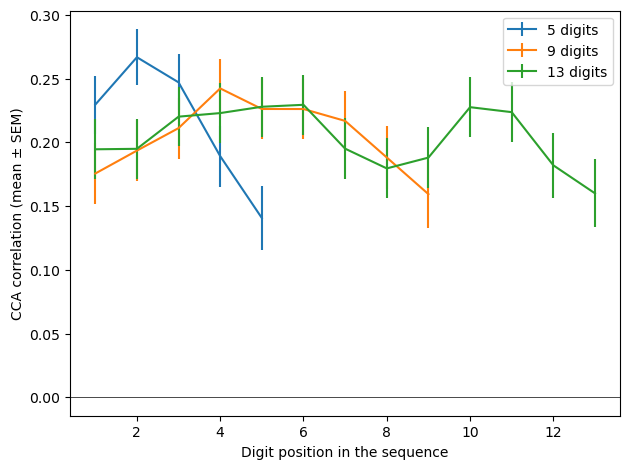

In [ ]:
import matplotlib.pyplot as plt

all_rows = []  # collect all trial-level results here
# best_shift_by_sub = {}  # best shift per subject
DIG_LEN   = 200           # 2 s at 100 Hz
rows_trials = []
rows_subject = [] 
best_shift_by_sub = {} 

for subj in SUBJECTS:
    print(f"Processing subject {subj:02d}...")
    trials = load_all_trials(subj)                         # list of (eeg, pupil)
    trials_memory, trials_control = split_trials_by_condition(trials)
    
    # ----- lag search on memory ------------------------------------------
    return_curve = False  # set to True if you want the full curve
    best_corr, best_shift, mean_r_per_shift = search_best_lag(trials_memory, candidate_lags_units(), return_curve)
    print(f"Subject {subj:02d}: best lag {best_shift*10} ms with r = {best_corr:.3f}")
    best_shift_by_sub[subj] = best_shift      # samples, not ms

    if return_curve:
        # -------------------------------------------------------------
        # 2) Build x and y vectors for plotting
        # -------------------------------------------------------------
        lags   = np.array(sorted(mean_r_per_shift))                 # x-axis (samples)
        r_mean = np.array([mean_r_per_shift[s] for s in lags])      # y-axis (mean r)

        # If you prefer milliseconds instead of samples:
        # fs = 1000  # replace with your real sampling rate
        # lags = lags * 1000 / fs

        # -------------------------------------------------------------
        # 3) Plot
        # -------------------------------------------------------------
        import matplotlib.pyplot as plt

        plt.figure(figsize=(6, 3.5))
        plt.plot(lags, r_mean, lw=2)
        plt.axvline(best_shift, ls='--', lw=1.5,
                    label=f'best lag = {best_shift}')
        plt.xlabel('Lag (samples)')
        plt.ylabel('Mean canonical correlation (r)')
        plt.title('Mean CCA correlation vs. lag')
        plt.grid(alpha=.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

    # ----- fit weights ONCE using all train trials at best_shift ---------

    best_shift = int(best_shift)  # convert to int if it was float
    X_mem, Y_mem = concat_trials(trials_memory, shift=best_shift)
    X_ctrl, Y_ctrl = concat_trials(trials_control, shift=best_shift)

    cca_mem = CCA(n_components=1, max_iter=1000, scale=False, tol=1e-6)
    cca_mem.fit(X_mem, Y_mem)

    
    # -------------------------------------------------------------
    # 2) whole‑trial correlation for MEMORY
    # -------------------------------------------------------------
    cvX_m, cvY_m = cca_mem.transform(X_mem, Y_mem)
    r_mem, p_mem = pearsonr(cvX_m[:, 0], cvY_m[:, 0])

    rows_subject.append({
        "subject":   subj,
        "condition": "memory",
        "lag_ms":    best_shift * 10,
        "r":         float(r_mem),
        "p-value": float(p_mem),
    })

    # -------------------------------------------------------------
    # 3) whole‑trial correlation for CONTROL
    # -------------------------------------------------------------
    cvX_c, cvY_c = cca_mem.transform(X_ctrl, Y_ctrl)
    r_ctrl, p_ctrl = pearsonr(cvX_c[:, 0], cvY_c[:, 0])

    rows_subject.append({
        "subject":   subj,
        "condition": "control",
        "lag_ms":    best_shift * 10,
        "r":         float(r_ctrl),
        "p-value": float(p_ctrl), 
    })

    save_cca_weights(cca_mem, subject_tag=f"sub-{subj:03d}", lag_ms=best_shift*10, condition = "mem", eeg_ch_names=FRONTAL_MIDLINE, out_dir=OUT_WEIGHTS)

    # ----- per-trial r on TEST with frozen lag & weights -----------------
    for eeg_s, pupil_s, meta in iterate_trials(trials_memory, best_shift):
        n_digits = meta['load']
        for d in range(n_digits):
            w = slice(d*DIG_LEN, (d+1)*DIG_LEN)

        #cca = CCA(n_components=1, max_iter=1000, scale=False, tol=1e-6)
        #cca.fit(eeg_s, pupil_s)
        cv_eeg, cv_pupil = cca_mem.transform(eeg_s, pupil_s)
        cv_eeg = cv_eeg[:, 0]  # first CCA component
        cv_pupil = cv_pupil[:, 0]  # first CCA component

        for d in range(n_digits):
            w = slice(d * DIG_LEN, (d + 1) * DIG_LEN)
            x, y = cv_eeg[w], cv_pupil[w]
            
            if x.size == 0 or y.size == 0:
                print("Empty slice:", meta['subject'], meta['epoch'], d)
                continue

            if not np.isfinite(x).all() or not np.isfinite(y).all():
                print("Non-finite values:", meta['subject'], meta['epoch'], d, "→", np.sum(~np.isfinite(x)), "bad in X;", np.sum(~np.isfinite(y)), "bad in Y")
                continue

            if np.std(x) == 0 or np.std(y) == 0:
                print("Const window:", meta['subject'], meta['epoch'], d, np.std(x), np.std(y))
                continue

            r = np.corrcoef(x, y)[0, 1]
            rows_trials.append({
                'subject': meta['subject'],
                'condition': meta['condition'],
                'load': meta['load'],
                'epoch': meta['epoch'],
                'lag_ms': best_shift * 10,  # convert samples to ms
                'digit_pos': d + 1,  # 1-based digit index
                'r': float(r),  # convert to plain float for JSON-ability
            })

        meta['r'] = float(np.corrcoef(cv_eeg, cv_pupil)[0,1])
        meta['lag_ms'] = best_shift *10
        all_rows.append(meta)

df_sameW = pd.DataFrame(rows_trials)
grand = (df_sameW.query("condition == 'memory'")
           .groupby(['load','digit_pos'])['r']
           .agg(['mean','sem'])
           .reset_index())

for L in [5,9,13]:
    sub = grand[grand.load == L]
    plt.errorbar(sub.digit_pos, sub['mean'],
                 yerr=sub['sem'], label=f"{L} digits")
plt.axhline(0, c='k', lw=.5)
plt.xlabel("Digit position in the sequence")
plt.ylabel("CCA correlation (mean ± SEM)")
plt.legend(); plt.tight_layout()

##############################################################################
# ---- save -----------------------------------------------------------------
##############################################################################
pd.DataFrame(all_rows).to_csv(OUT_TRIALS, index=False)
print(f"Finished - saved per-trial correlations with plain CCA as {OUT_TRIALS}.")

##############################################################################
# 4)  after the loop - save per‑subject correlations
##############################################################################
pd.DataFrame(rows_subject).to_csv(OUT_SUBJECT, index=False)
print(f"Finished - saved subject-level correlations as {OUT_SUBJECT}.")


In [8]:
# 1. Load the file
corr_sub = pd.read_csv(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\subject_level_cca_fast.csv")

# 2. Sort rows by the “r” column (descending) and keep the 10 largest
top10 = corr_sub.sort_values("r", ascending=False).head(10)

# 3. Do whatever you need with those lines
print(top10)   

# 1. Load the file
corr_sub = pd.read_csv(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\trial_level_cca_fast.csv")

# 2. Sort rows by the “r” column (descending) and keep the 10 largest
top10 = corr_sub.sort_values("r", ascending=False).head(10)

# 3. Do whatever you need with those lines
print(top10)   

    subject condition  lag_ms         r  p-value
24       46    memory    1000  0.534267      0.0
4        35    memory     700  0.444390      0.0
12       40    memory     400  0.396181      0.0
10       39    memory     300  0.338895      0.0
28       48    memory     400  0.329245      0.0
44       57    memory       0  0.327929      0.0
14       41    memory     300  0.313871      0.0
13       40   control     400  0.304994      0.0
34       51    memory     200  0.299291      0.0
46       58    memory     400  0.296483      0.0
      subject condition  load          epoch         r  lag_ms
1058  sub-049    memory     5  trial_157.csv  0.927683     400
1501  sub-056    memory     5  trial_150.csv  0.923795    -100
1570  sub-057    memory     5  trial_064.csv  0.905976       0
204   sub-035    memory     5  trial_021.csv  0.904704     700
1885  sub-060    memory     5  trial_102.csv  0.904083   -1000
1384  sub-055    memory     5  trial_008.csv  0.895261    -200
1119  sub-050    mem

In [12]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import statsmodels.formula.api as smf
import statsmodels.stats.anova as sm_anova

# keep only MEMORY trials and clip r to avoid ±∞ after Fisher-z
df_mem_sameW = (df_sameW.query("condition == 'memory'")
            .assign(z = lambda d: np.arctanh(
                d.r.clip(lower=-0.999_999, upper=0.999_999))))

loads   = sorted(df_mem_sameW.load.unique())      # [5, 9, 13]
digits  = sorted(df_mem_sameW.digit_pos.unique()) # 1 … 13

for L in loads:
    wide = (df_mem_sameW.query("load == @L")
                   .pivot_table(index="subject",
                                columns="digit_pos",
                                values="r",
                                aggfunc="mean")
                   .dropna())          # subject must have every digit

    long = wide.reset_index().melt(id_vars='subject',
                                   var_name='digit_pos',
                                   value_name='r')

    model = smf.ols("r ~ C(digit_pos) + C(subject)", data=long).fit()
    anova = sm_anova.anova_lm(model, typ=2)
    print(f"\n=== Load {L} digits ===")
    print(anova.loc["C(digit_pos)"])

    df_num = int(anova.loc["C(digit_pos)", "df"])   # k‑1
    df_den = int(anova.loc["Residual",     "df"])   # (k‑1)*(s‑1)

    Fval   = anova.loc["C(digit_pos)", "F"]
    pval   = anova.loc["C(digit_pos)", "PR(>F)"]

    print(f"F({df_num}, {df_den}) = {Fval:.2f},  p = {pval:.3g}")







=== Load 5 digits ===
sum_sq    0.331453
df        4.000000
F         5.341708
PR(>F)    0.000595
Name: C(digit_pos), dtype: float64
F(4, 104) = 5.34,  p = 0.000595

=== Load 9 digits ===
sum_sq    0.196681
df        8.000000
F         1.215765
PR(>F)    0.291333
Name: C(digit_pos), dtype: float64
F(8, 200) = 1.22,  p = 0.291

=== Load 13 digits ===
sum_sq     0.131097
df        12.000000
F          0.433235
PR(>F)     0.949546
Name: C(digit_pos), dtype: float64
F(12, 312) = 0.43,  p = 0.95


In [13]:
import statsmodels.api as sm

for L in loads:
    long = (df_mem_sameW.query("load == @L")
            .pivot_table(index="subject", columns="digit_pos", values="z", aggfunc="mean")
            .dropna()
            .reset_index()
            .melt(id_vars="subject", var_name="digit_pos", value_name="z"))
    aov = sm.stats.AnovaRM(long, depvar="z", subject="subject", within=["digit_pos"]).fit()
    print(f"\n=== Load {L} RM-ANOVA (omnibus) ===")
    print(aov)  # the table line for digit_pos is your omnibus test



=== Load 5 RM-ANOVA (omnibus) ===
                 Anova
          F Value Num DF  Den DF  Pr > F
----------------------------------------
digit_pos  3.0817 4.0000 104.0000 0.0192


=== Load 9 RM-ANOVA (omnibus) ===
                 Anova
          F Value Num DF  Den DF  Pr > F
----------------------------------------
digit_pos  0.6760 8.0000 200.0000 0.7123


=== Load 13 RM-ANOVA (omnibus) ===
                  Anova
          F Value  Num DF  Den DF  Pr > F
-----------------------------------------
digit_pos  0.2174 12.0000 312.0000 0.9976



In [24]:
import os, fnmatch, pandas as pd, numpy as np
import matplotlib.pyplot as plt
def find_weight_file(subj: int,
                     base_dir: Path = WEIGHT_DIR
                     ) -> Path:
    """
    Find the CSV for given condition ('ctrl' or 'mem') for the chosen subject.
    If lag_ms is provided, match exactly. Otherwise, take any that matches.
    """
    subj_str = f"{subj:03d}"
    subj_glob = f"sub-{subj_str}_eeg_weights_mem_*.csv"
    candidates = list((base_dir).glob(subj_glob))
    if not candidates:
        return None
    if len(candidates) > 1:
        return None  # ambiguous
    return candidates[0]

def load_weights(subj: int):
    csv_path = find_weight_file(subj)
    if csv_path is None or not csv_path.exists():
        return None, None
    df = pd.read_csv(csv_path)
    ch_names = df['channel'].tolist()
    weights  = df['weight'].to_numpy()
    return ch_names, weights

# ---------------------------------------------------------------------
# helper: read the weight CSV that matches subject + condition + lag
# ---------------------------------------------------------------------
data = pd.read_csv(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\subject_level_cca_fast.csv")
best_shift_by_sub = data.groupby("subject")["lag_ms"].agg(lambda x: x.value_counts().index[0]).to_dict()

WEIGHT_DIR = Path(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\cca_weights_fast")

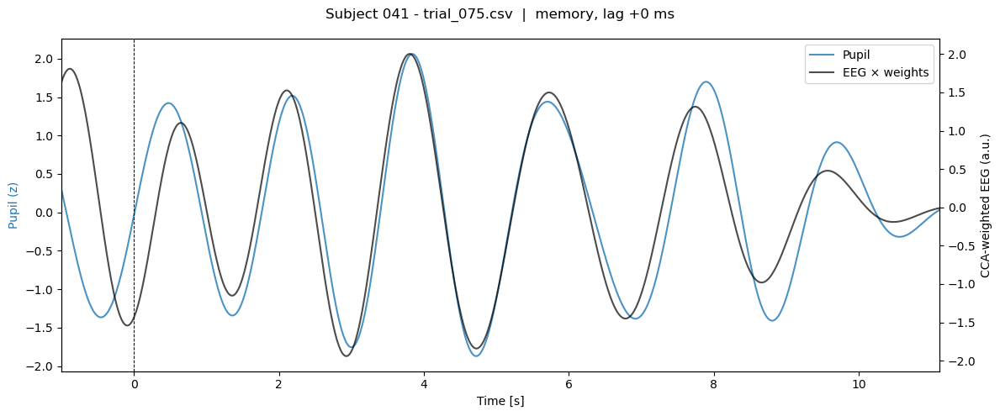

In [25]:

# ---------------------------------------------------------------------
# plotting one trial with the CCA-weighted EEG
# ---------------------------------------------------------------------
plot_sub      = 41
plot_trial    = "trial_075.csv"
condition     = "memory"          # or "control"
lag_samples   = best_shift_by_sub.get(plot_sub, 0) // 10  # your 100 Hz lag
lag_ms        = lag_samples * 10                   # for the file name

# -- load the trial ---------------------------------------------------
for eeg, pupil, meta in load_all_trials(plot_sub):
    if meta["epoch"] == plot_trial:
        break
else:
    raise ValueError(f"{plot_trial} not found for subject {plot_sub}")

# -- load weights & build weight vector --------------------------------
ch_names, weights   = load_weights(plot_sub)

if ch_names is None or weights is None:
    print(f"Missing or ambiguous weights for subject {plot_sub:03d}, cannot plot.")
if ch_names != FRONTAL_MIDLINE:
    print(f"Warning: channel names in weights do not match expected frontal midline set.")

# -- project EEG and (optionally) roll for lag -------------------------
eeg_w = np.dot(eeg, weights)

if lag_samples:
    eeg_w = np.roll(eeg_w, lag_samples)[win]

# -- prep pupil --------------------------------------------------------
pupil_vec = pupil.ravel()[win]                # (T,)

# -- trim to common length --------------------------------------------
T = min(len(eeg_w), len(pupil_vec))
#eeg_w, pupil_vec = eeg_w[:T], pupil_vec[:T]
t = np.arange(T) / 100.0 -1.0                       # s @100 Hz

# -- plot --------------------------------------------------------------
fig, ax1 = plt.subplots(figsize=(12, 5))
ax2      = ax1.twinx()

ax1.plot(t, pupil_vec,  color="#1f77b4", alpha=.8, label="Pupil")
ax2.plot(t, eeg_w,      color="black", alpha=.7, label="EEG × weights")

ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Pupil (z)",                      color="#1f77b4")
ax2.set_ylabel("CCA-weighted EEG (a.u.)",        color="black")

ax1.set_xlim(-1, t[-100])
ax2.set_xlim(-1, t[-100])

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1+lines2, labels1+labels2, loc="upper right")

ax1.axvline(0, ls="--", c="k", lw=.7)
fig.suptitle(f"Subject {plot_sub:03d} - {plot_trial}  |  "
             f"{condition}, lag {lag_ms:+d} ms")
fig.tight_layout()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

PLOTS_DIR = Path(r"C:\Users\cdd\OneDrive - Danmarks Tekniske Universitet\Spring2025\Special_course\plots_appC")
PLOTS_DIR.mkdir(parents=True, exist_ok=True)      # creates the folder tree if it doesn't exist

def trial_average2(sub_id, trials, load, cond, lag_samples=0, channels=FRONTAL_MIDLINE):
    """
    Return average pupil (T,) and EEG (T,) for a given load.
    * trials      - list of (eeg, pupil, meta) tuples
    * load        - 5 / 9 / 13
    * lag_samples - positive = shift EEG *forward* relative to pupil
    """
    eeg_list, pupil_list = [], []

    ch_names, weights   = load_weights(sub_id)

    if ch_names is None or weights is None:
        print(f"Missing or ambiguous weights for subject {sub_id:03d}, cannot plot.")
    if ch_names != FRONTAL_MIDLINE:
        print(f"Warning: channel names in weights do not match expected frontal midline set.")


    for eeg, pupil, meta in trials:
        if meta["load"] != load:
            continue

        # -- project EEG and (optionally) roll for lag -------------------------
        eeg_roi = np.dot(eeg, weights)
        
        # temporal alignment ---------------------------------------------------
        if lag_samples != 0:
           eeg_roi = np.roll(eeg_roi, lag_samples)

        T = min(len(eeg_roi), len(pupil))
        eeg_list.append(eeg_roi[win])
        pupil_list.append(pupil[win, 0])

    # stack, crop to shortest, compute mean ± SEM
    if not eeg_list:                      # no trials for this load
        return None

    L = min(map(len, eeg_list))
    eeg_mat   = np.stack([e[:L] for e in eeg_list])
    pupil_mat = np.stack([p[:L] for p in pupil_list])

    eeg_avg   = eeg_mat.mean(axis=0)
    eeg_sem   = eeg_mat.std(axis=0, ddof=1) / np.sqrt(eeg_mat.shape[0])
    pupil_avg = pupil_mat.mean(axis=0)
    pupil_sem = pupil_mat.std(axis=0, ddof=1) / np.sqrt(pupil_mat.shape[0])

    t = np.arange(L) / 100.0 -1.0             # 100 Hz → seconds
    return t, (eeg_avg, eeg_sem), (pupil_avg, pupil_sem)

import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# ------------------------------------------------------------------ #
# ❶  Load the subject-level CCA table *once* at module import time
# ------------------------------------------------------------------ #
CCA_FILE = Path(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\subject_level_cca_slow.csv")
CCA_DF   = pd.read_csv(CCA_FILE)        # columns: subject, condition, lag_ms, r, p-value
CCA_DF["condition"] = CCA_DF["condition"].str.lower()   # normalise to lowercase
CCA_DF.set_index(["subject", "condition"], inplace=True)

# ------------------------------------------------------------------ #
def plot_subject2(sub_id: int, loads=(5, 9, 13)):
    """
    One figure with 3 (rows = load) × 2 (cols = task) panels.
    Each panel overlays pupil and EEG-θ for a single load and task,
    and the panel title now includes the subject-specific CCA 'r'.
    """
    trials = load_all_trials(sub_id)
    mem, ctl = split_trials_by_condition(trials)

    lag       = best_shift_by_sub.get(sub_id, 0)  // 10          # samples @100 Hz
    colors    = {5: "#1f77b4", 9: "#ff7f0e", 13: "#2ca02c"}
    task_sets = [(mem, "memory"), (ctl, "control")]

    # ── look up the two r values for this subject ──────────────────
    r_memory  = float(CCA_DF.loc[(sub_id, "memory"), "r"])   if (sub_id, "memory")  in CCA_DF.index else float("nan")
    r_control = float(CCA_DF.loc[(sub_id, "control"), "r"])  if (sub_id, "control") in CCA_DF.index else float("nan")
    r_by_cond = {"memory": r_memory, "control": r_control}

    # ── make subplot grid (no shared x) ───────────────────────────
    fig, axes = plt.subplots(len(loads), 2, figsize=(12, 9), sharey="row")
    legend_handles, legend_labels = [], []

    for row, load in enumerate(loads):
        for col, (trial_set, cond) in enumerate(task_sets):
            ax = axes[row, col]

            res = trial_average2(sub_id, trial_set, load, cond, lag_samples=lag)
            if res is None:            # no data → hide the axis
                print(f"Subject {sub_id:02d} has no trials for load {load} ({cond})")
                ax.set_visible(False)
                continue

            t, (eeg_avg, eeg_sem), (pup_avg, pup_sem) = res
            # ─────────── z-score each series ──────────────────────────
            # (mean-remove, divide by SD; adjust SEM by the same SD)
            p_mean, p_std = pup_avg.mean(), pup_avg.std(ddof=0)
            e_mean, e_std = eeg_avg.mean(), eeg_avg.std(ddof=0)

            pup_avg = (pup_avg - p_mean) / p_std
            pup_sem = pup_sem / p_std

            eeg_avg = (eeg_avg - e_mean) / e_std
            eeg_sem = eeg_sem / e_std


            # pupil ────────────────────────────────────────────────
            ax.plot(t, pup_avg, color=colors[load], label="Pupil")
            ax.fill_between(t, pup_avg - pup_sem, pup_avg + pup_sem, color=colors[load], alpha=.25)

            # EEG θ ────────────────────────────────────────────────
            ax_r = ax.twinx()
            ax_r.plot(t, eeg_avg, color="black", lw=1.2, label="θ")
            ax_r.fill_between(t, eeg_avg - eeg_sem, eeg_avg + eeg_sem, color="black", alpha=.15)

            # cosmetics ───────────────────────────────────────────
            ax.set_xlim(-1, t[-100])
            ax.set_yticks([]); ax_r.set_yticks([])
            ax.axvline(0, ls="--", c="k", lw=.7)

            if col == 0:
                ax.set_ylabel(f"Load {load:02d}")
            if row == 0:
                # add r to title
                r_val = r_by_cond[cond]
                ax.set_title(f"{cond.capitalize()}  (r = {r_val:.3f})")

            if not legend_handles:
                legend_handles += ax.get_lines() + ax_r.get_lines()
                legend_labels  += [h.get_label() for h in legend_handles]

    axes[0, 0].legend(legend_handles, legend_labels,
                      loc="upper right", frameon=False)

    fig.suptitle(f"Subject {sub_id:03d}   |   lag = {lag/100:.2f} s")
    fig.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()
    # ── SAVE the figure ───────────────────────────────────────────
    # ── SAVE instead of show ────────────────────────────────────────
    fname = PLOTS_DIR / f"s{sub_id:02d}.png"      #  e.g.  s05.png
    fig.savefig(fname, dpi=300, bbox_inches="tight")
    plt.close(fig)    


c:\Users\cdd\AppData\Local\anaconda3\envs\special_course_env\lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\cdd\AppData\Local\anaconda3\envs\special_course_env\lib\site-packages\numpy\core\_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


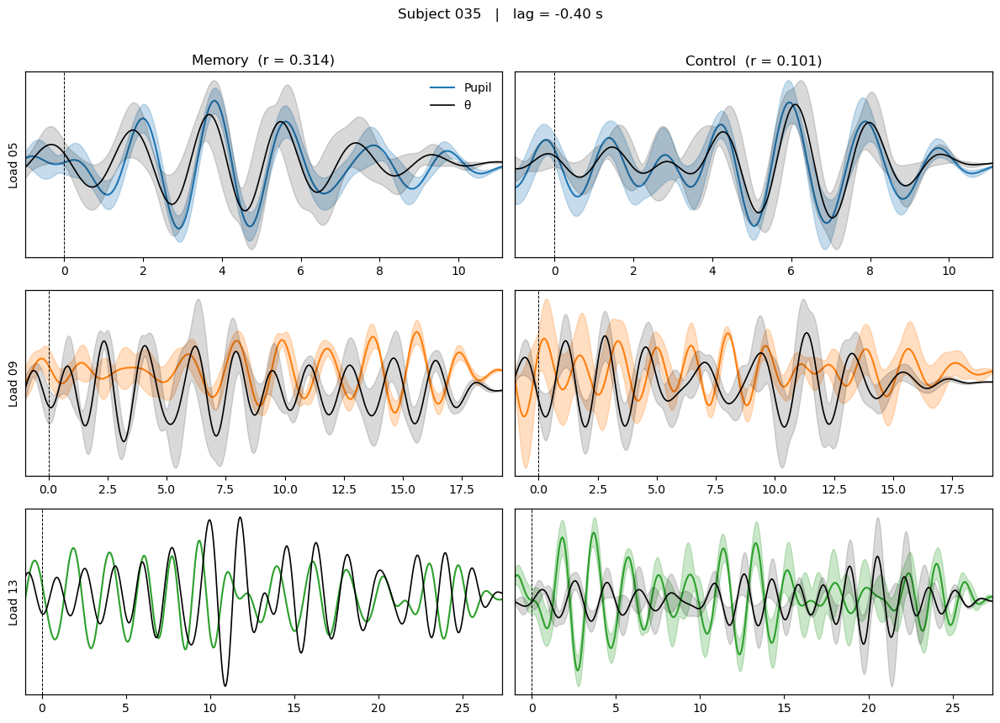

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


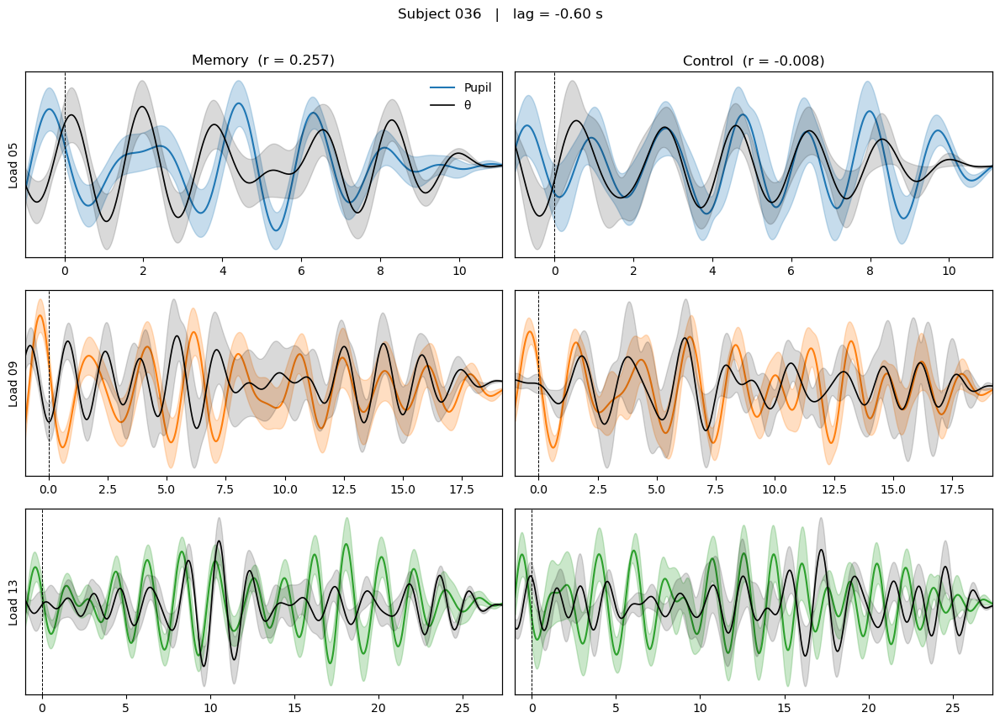

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


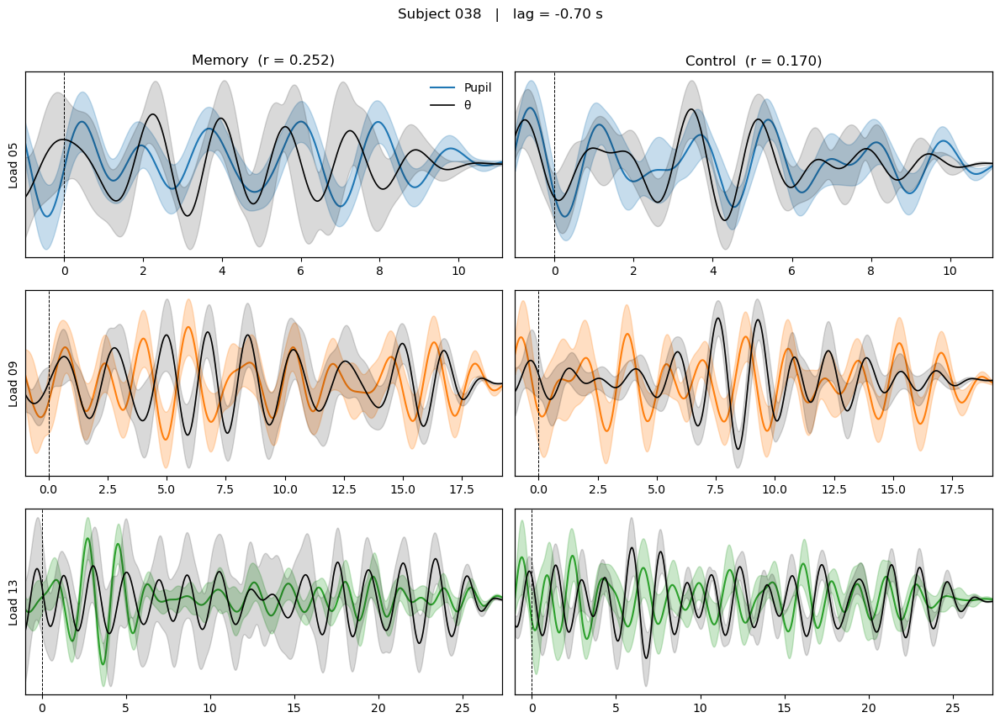

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


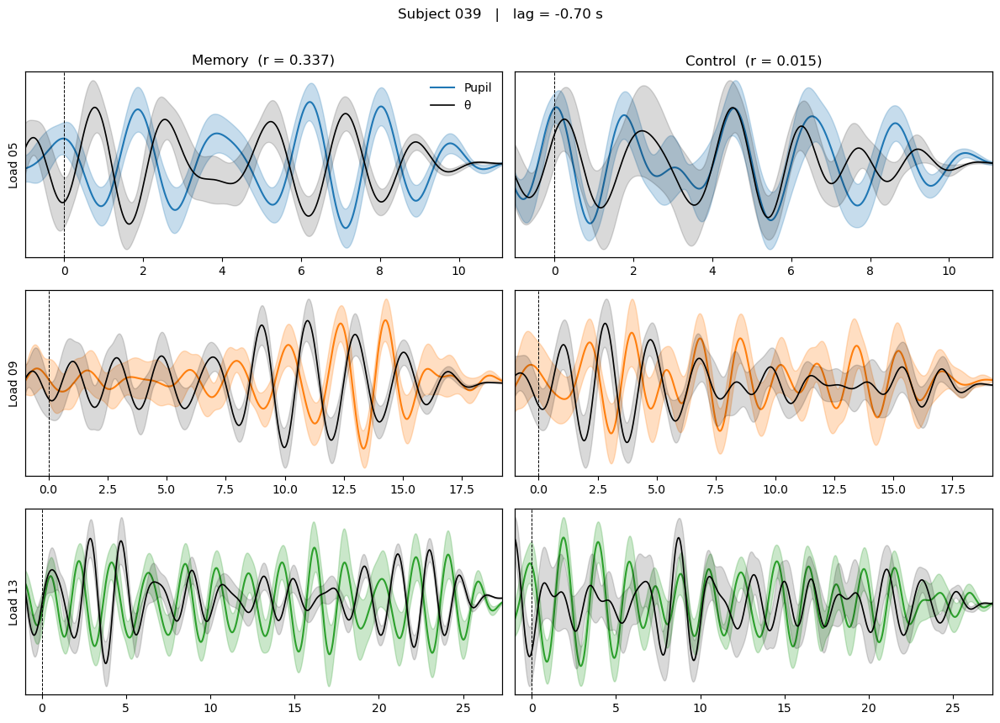

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


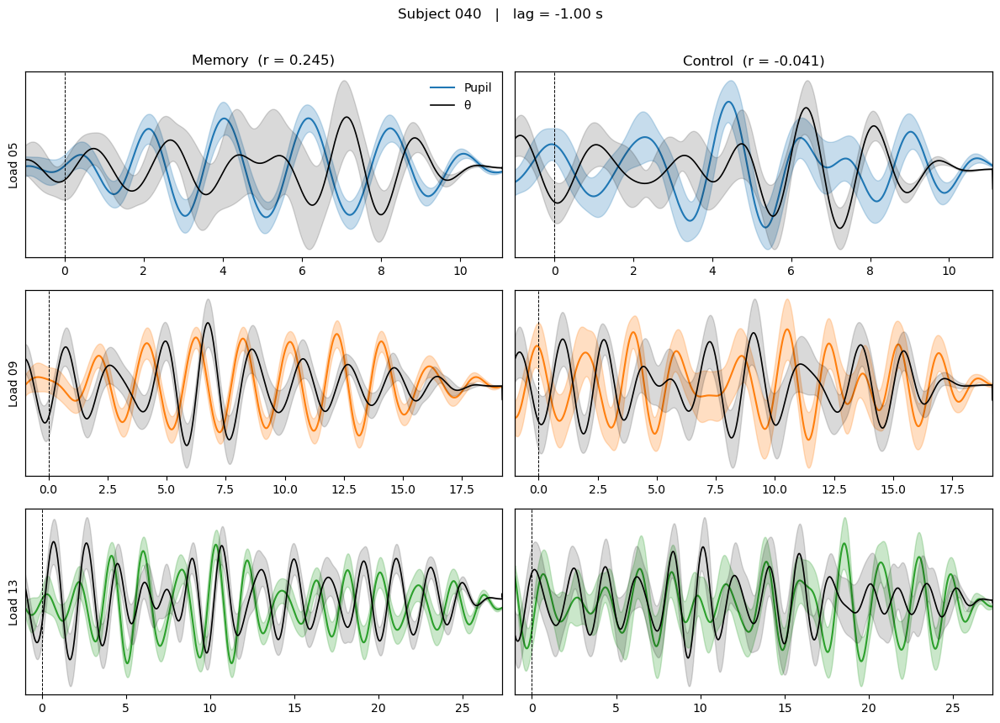

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


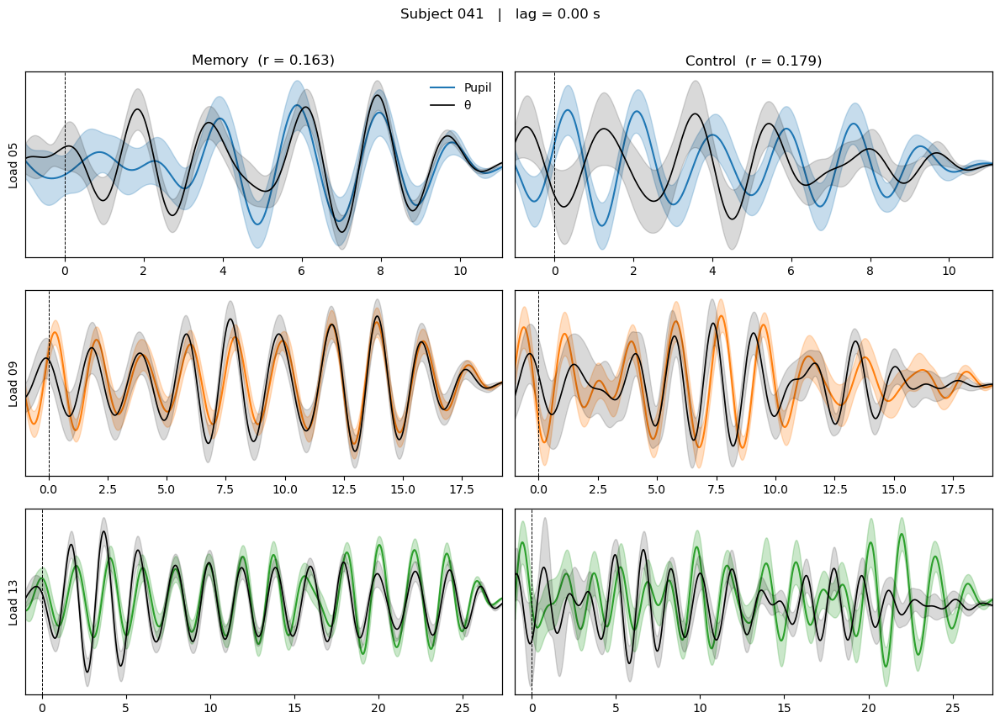

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


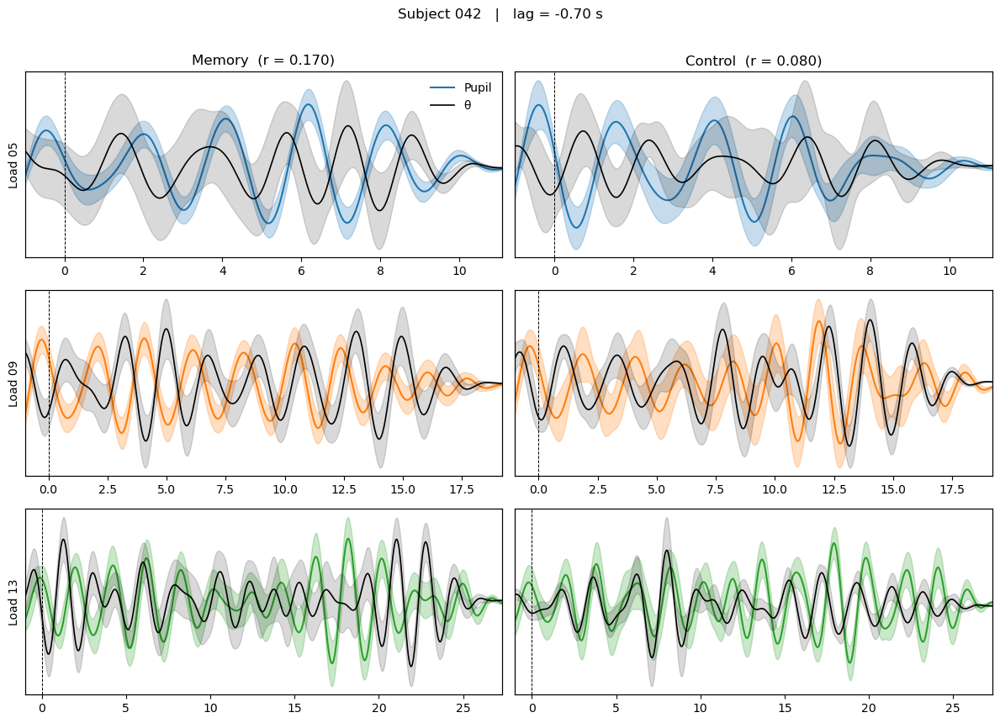

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


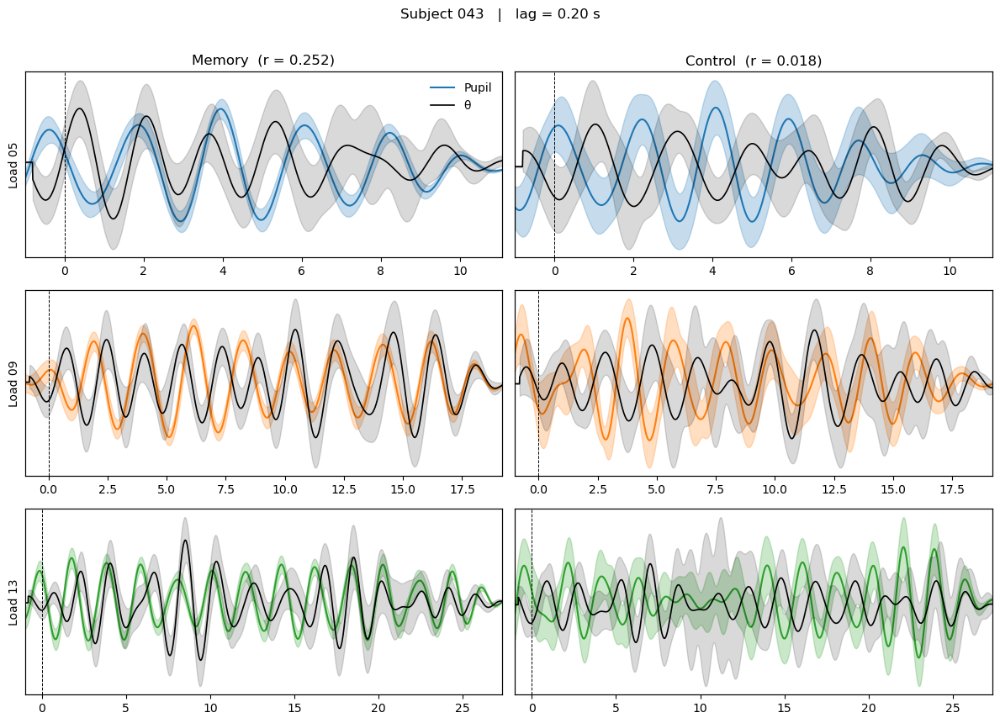

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


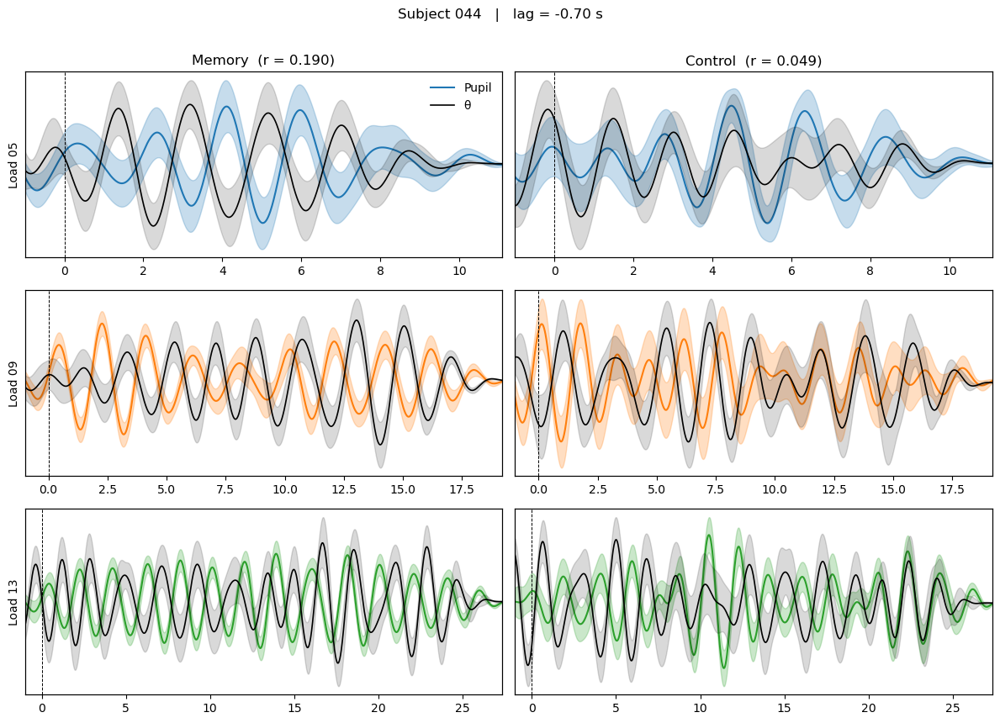

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


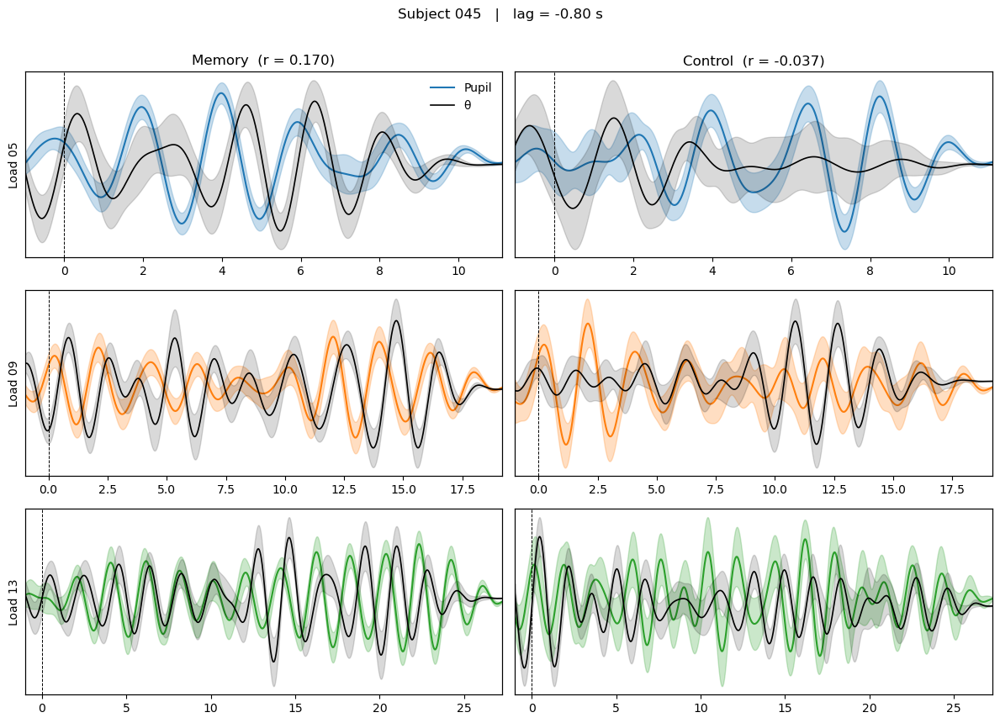

c:\Users\cdd\AppData\Local\anaconda3\envs\special_course_env\lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\cdd\AppData\Local\anaconda3\envs\special_course_env\lib\site-packages\numpy\core\_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


Subject 46 has no trials for load 9 (memory)


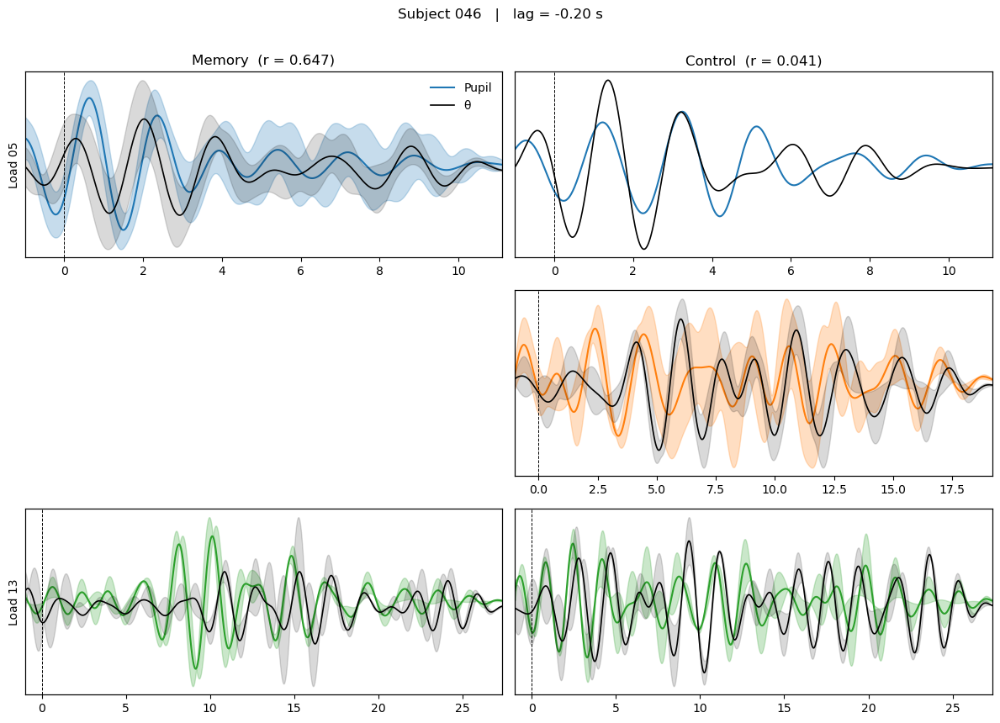

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


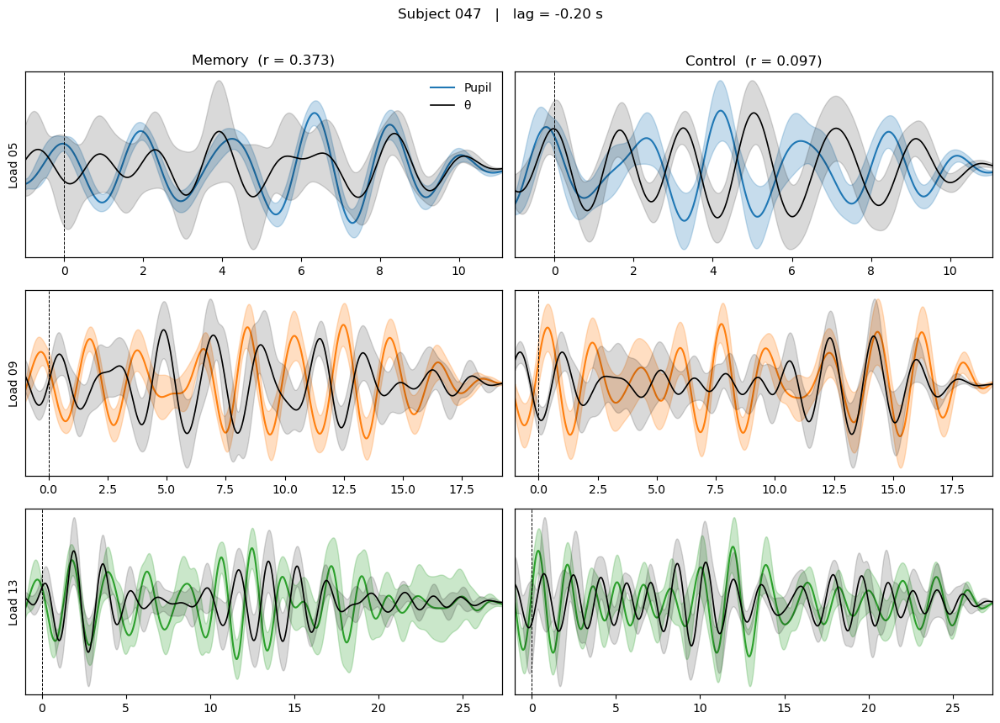

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


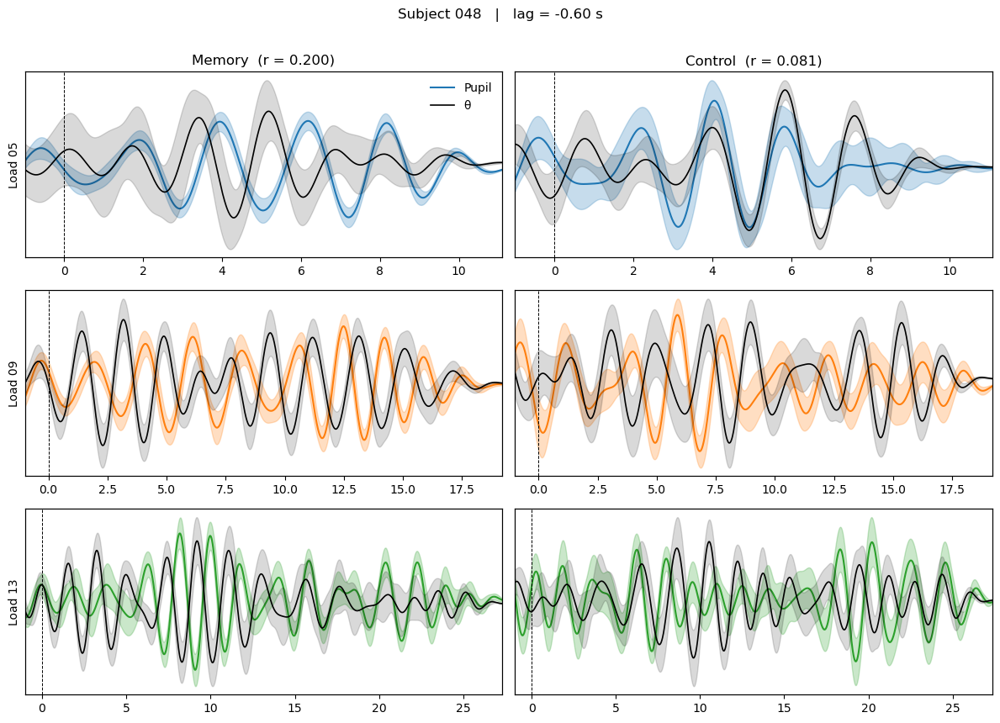

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


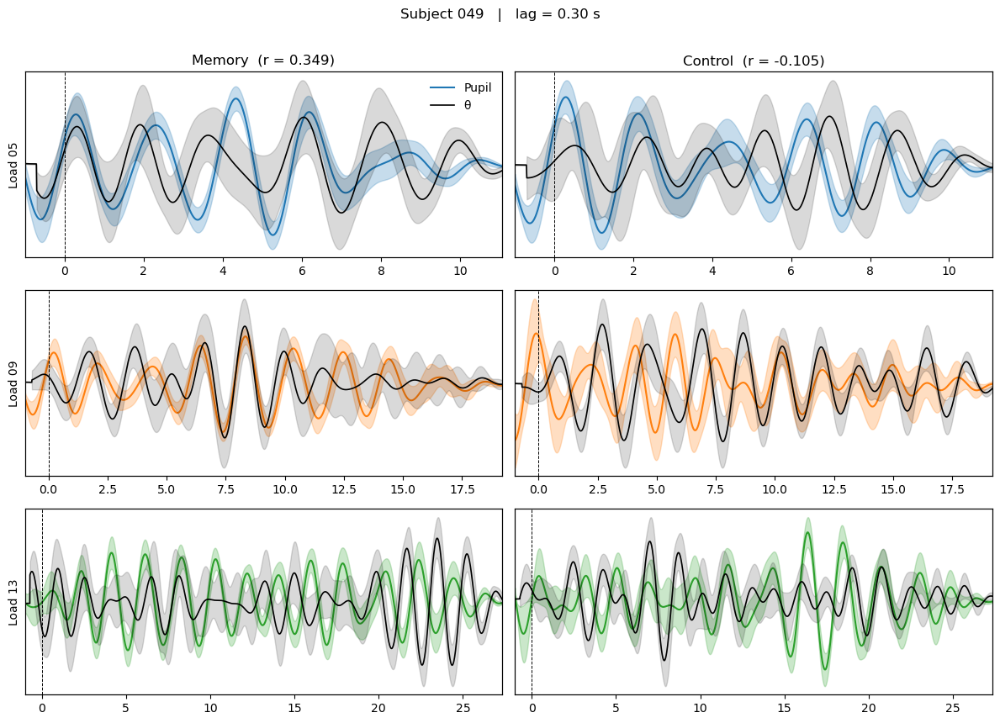

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


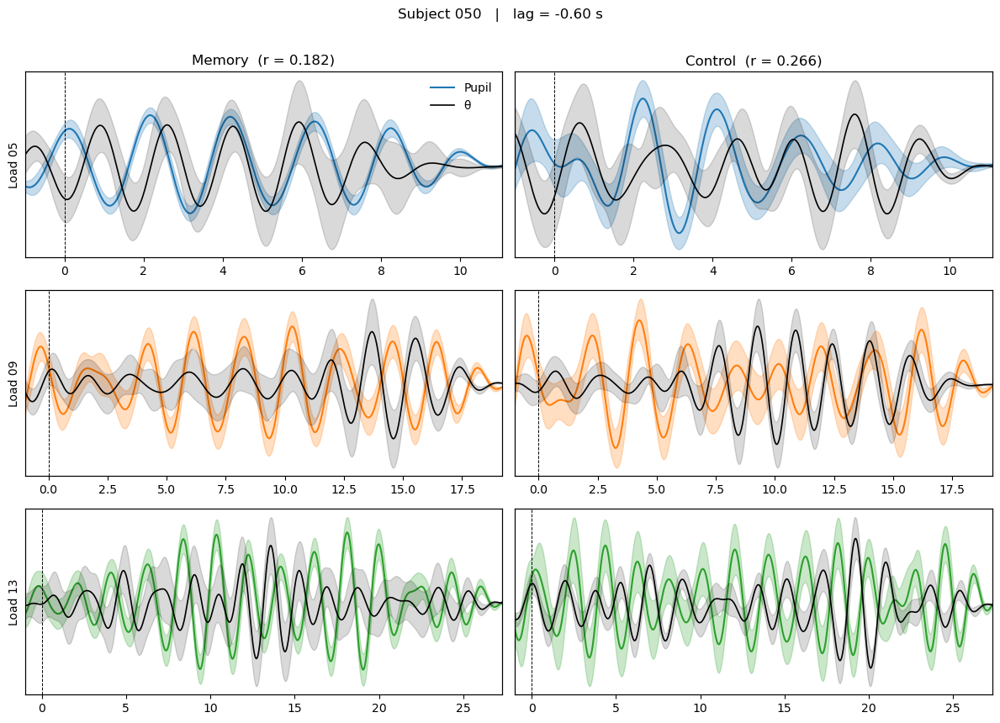

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


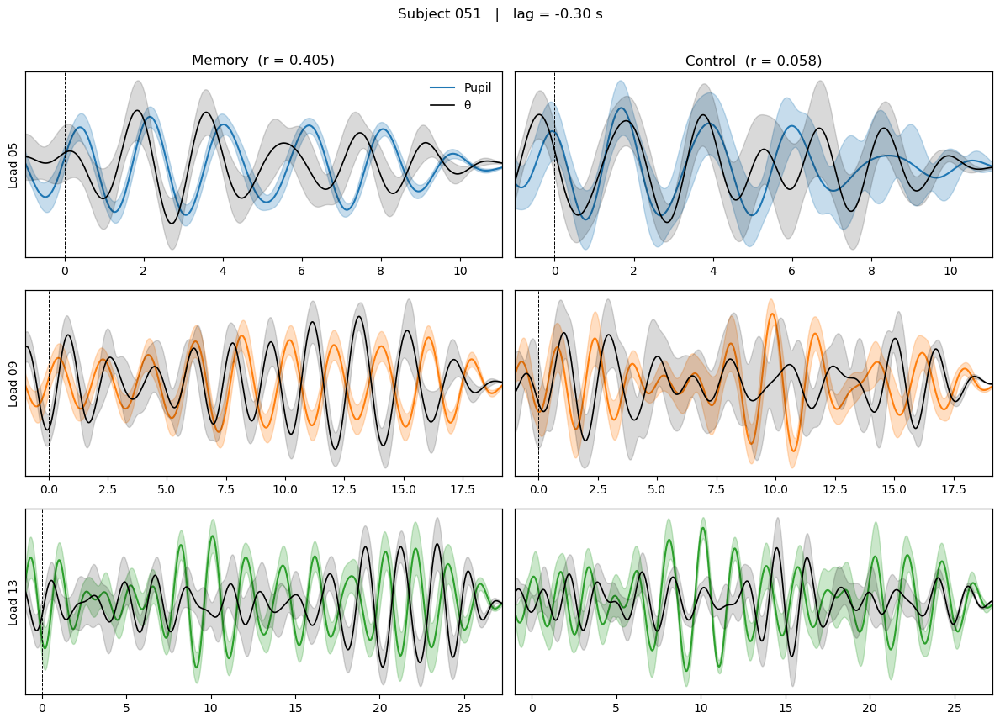

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


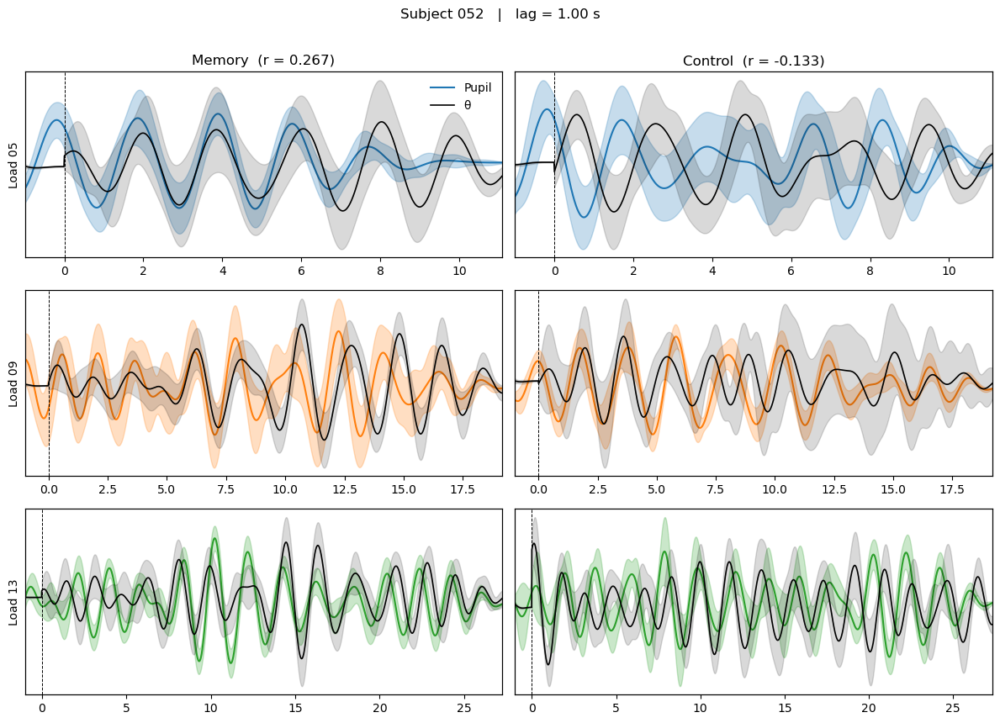

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


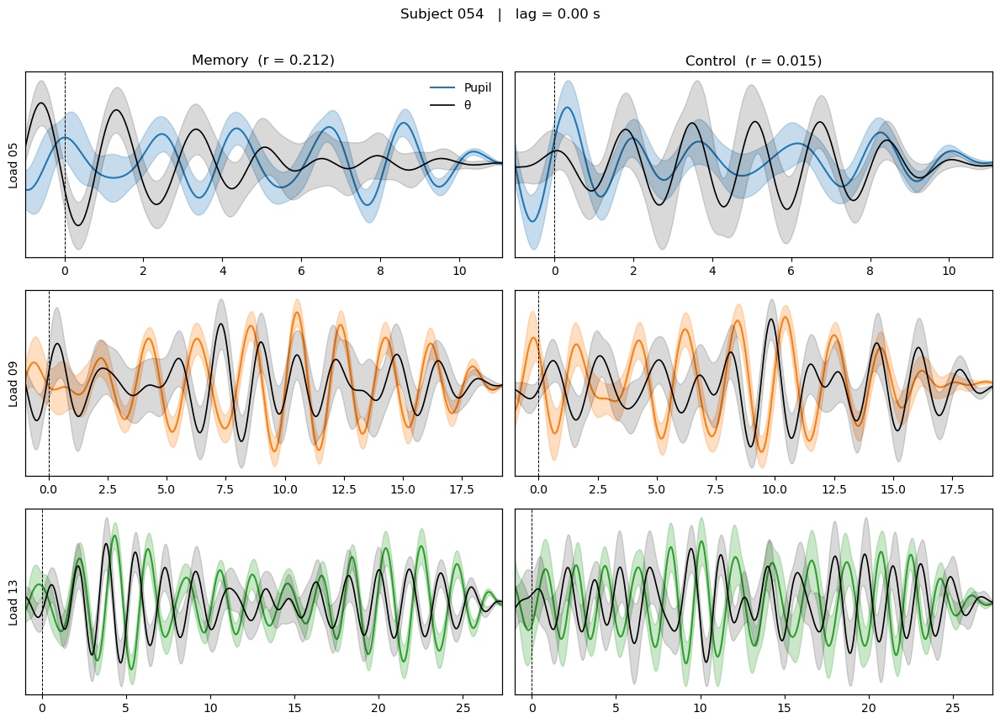

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


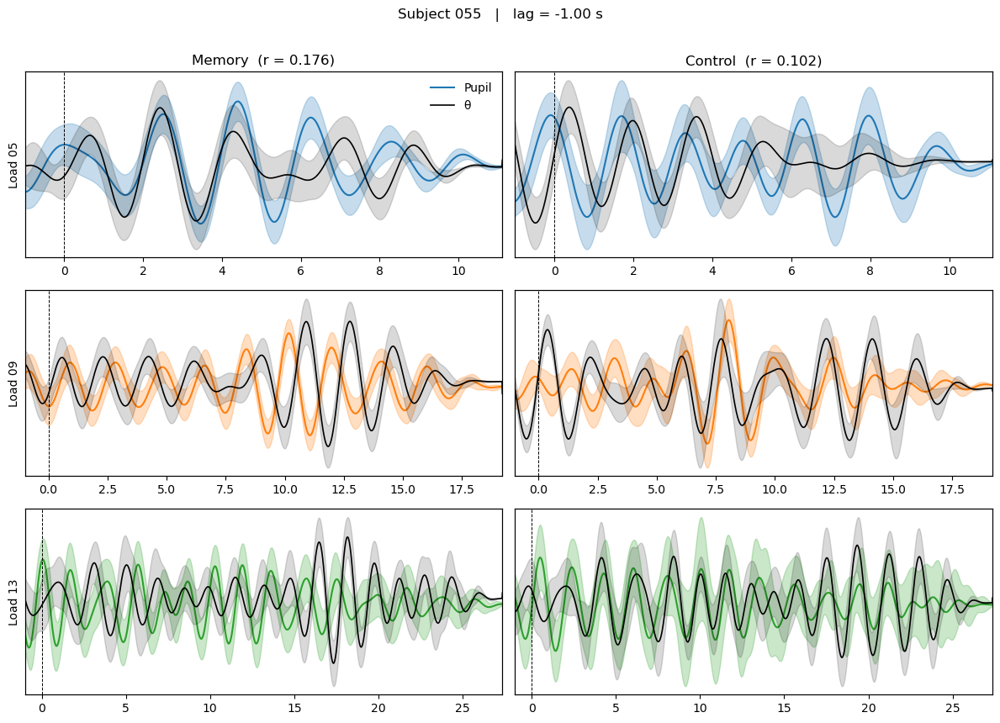

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


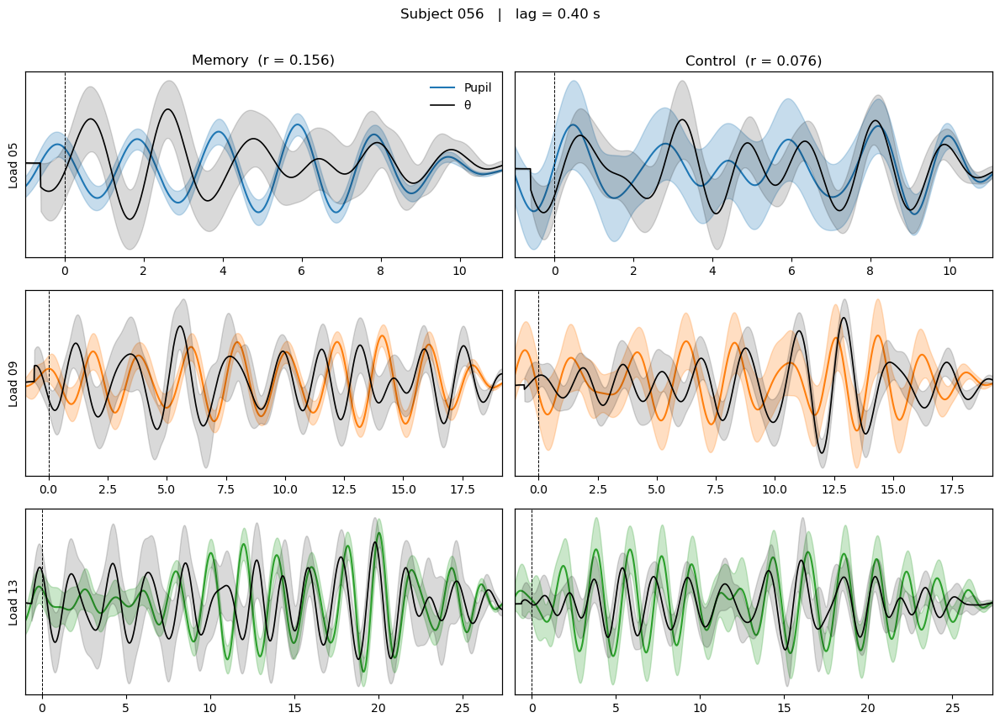

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


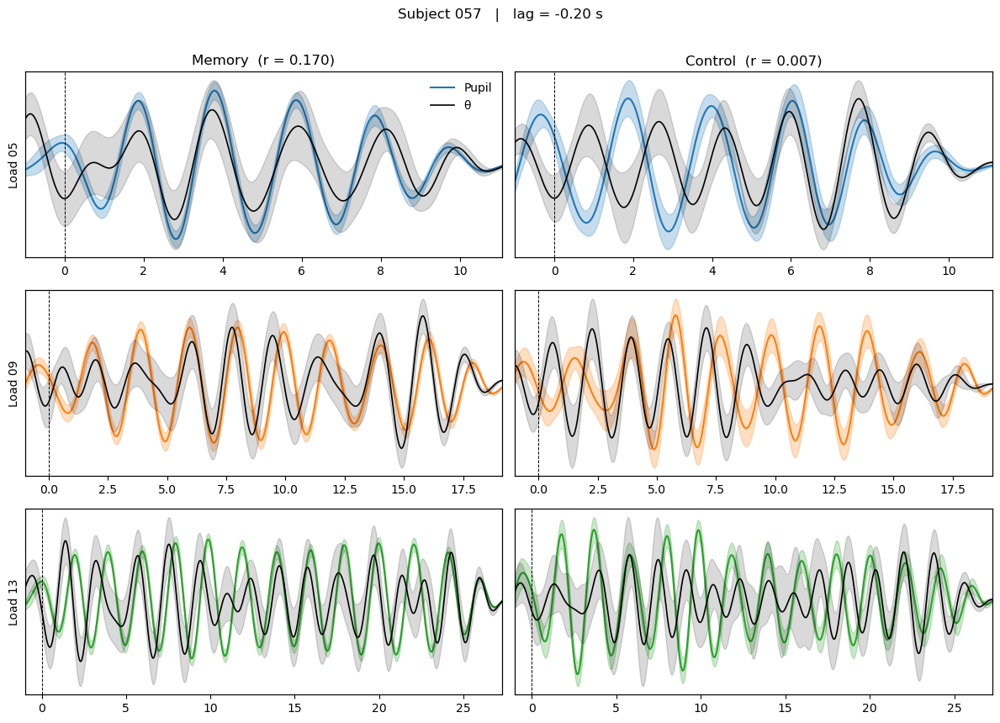

C:\Users\cdd\AppData\Local\Temp\ipykernel_27380\3924123886.py:138: MatplotlibDeprecationWarning: An artist whose label starts with an underscore was passed to legend(); such artists will no longer be ignored in the future.  To suppress this warning, explicitly filter out such artists, e.g. with `[art for art in artists if not art.get_label().startswith('_')]`.
  axes[0, 0].legend(legend_handles, legend_labels,


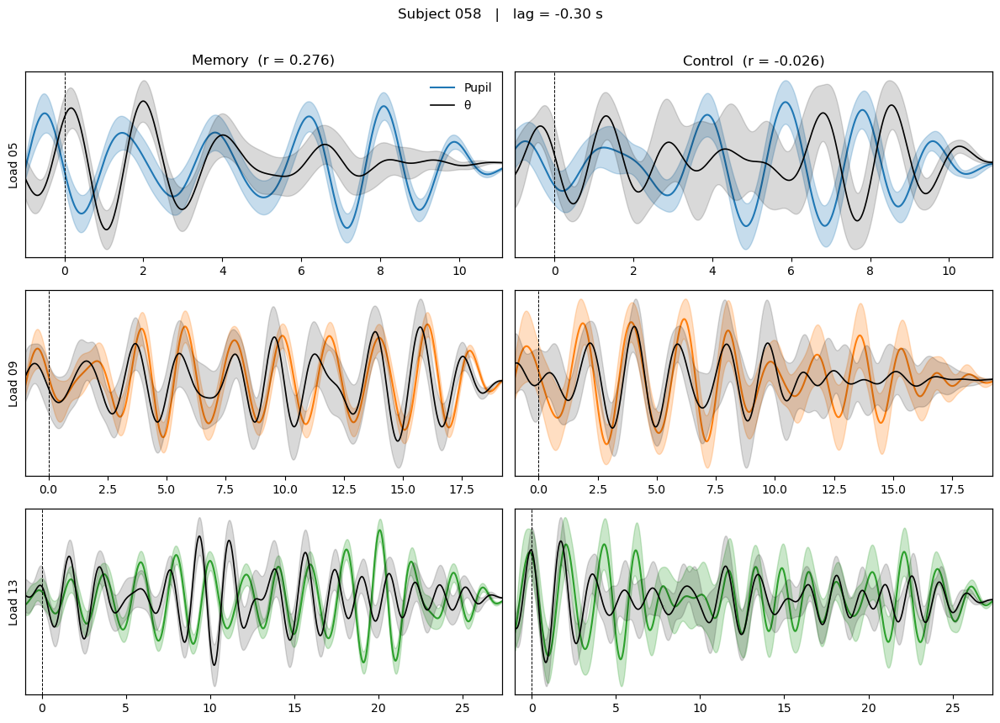

In [27]:
for subj in SUBJECTS:   # or any custom list
    plot_subject2(subj)

In [3]:
import pandas as pd
from pathlib import Path

# --- INPUT FILES (edit if your paths differ) ---
p_fast = Path(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\subject_level_cca_fast.csv")
p_slow = Path(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\subject_level_cca_slow.csv")
p_both = Path(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\subject_level_cca_trained_test_all.csv")

# --- helper: collapse to one lag per subject (check mem=ctrl) ---
def one_lag_per_subject(csv_path, label):
    df = pd.read_csv(csv_path)
    # keep only needed cols; ensure correct dtypes
    df = df[["subject", "condition", "lag_ms"]].copy()
    df["subject"] = df["subject"].astype(int)

    # check that, for each subject, mem & ctrl have same lag
    bad = []
    collapsed = []
    for subj, g in df.groupby("subject"):
        lags = g.groupby("condition")["lag_ms"].unique().to_dict()
        # collect unique lags across all conditions
        uniq = pd.unique(g["lag_ms"])
        if len(uniq) != 1:
            bad.append((subj, {k: v.tolist() for k, v in lags.items()}))
            # pick the most frequent lag as fallback
            lag = g["lag_ms"].mode().iat[0]
        else:
            lag = uniq[0]
        collapsed.append({"subject": subj, f"lag_{label}": int(lag)})
    if bad:
        print(f"[WARN] {len(bad)} subjects have different lags across conditions in {label}:")
        for subj, det in bad[:10]:
            print(f"  subject {subj}: {det}")  # shows mem/ctrl lags
        if len(bad) > 10:
            print("  ...")

    return pd.DataFrame(collapsed)

lag_fast = one_lag_per_subject(p_fast, "fast")
lag_slow = one_lag_per_subject(p_slow, "slow")
lag_both = one_lag_per_subject(p_both, "both")

# --- merge into a single table ---
out = lag_both.merge(lag_slow, on="subject", how="outer") \
              .merge(lag_fast, on="subject", how="outer") \
              .sort_values("subject").reset_index(drop=True)

# optional: make columns order nice
out = out[["subject", "lag_both", "lag_slow", "lag_fast"]]

# --- save ---
out_path = p_both.parent / "subject_level_cca_lags_merged.csv"
out.to_csv(out_path, index=False)
print(f"Saved: {out_path}")

# --- quick peek ---
print(out.head(10).to_string(index=False))


Saved: C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\subject_level_cca_lags_merged.csv
 subject  lag_both  lag_slow  lag_fast
      33    1000.0      -200     -1000
      34     300.0      1000      -300
      35    -800.0      1000       700
      36     300.0     -1000     -1000
      38     900.0       400       400
      39     400.0       300       300
      40    1000.0      1000       400
      41     500.0      -500       300
      42    -900.0       600      -900
      43     600.0      -100       600


In [10]:
import pandas as pd
from pathlib import Path

# --- INPUT FILES ---
p_fast = Path(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\subject_level_cca_fast.csv")
p_slow = Path(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\fast_slow_components\subject_level_cca_slow.csv")
p_both = Path(r"C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\subject_level_cca_trained_test_all.csv")

def one_r_per_subject_memory(csv_path, label):
    df = pd.read_csv(csv_path)
    # sanity checks
    must_have = {"subject", "condition", "r"}
    missing = must_have - set(df.columns)
    if missing:
        raise ValueError(f"{csv_path} missing columns: {missing}")

    # filter to memory only
    mem = df[df["condition"].str.lower() == "memory"].copy()
    mem["subject"] = mem["subject"].astype(int)

    # collapse: pick row with largest |r| per subject
    rows = []
    for subj, g in mem.groupby("subject"):
        idx = g["r"].abs().idxmax()
        rows.append({"subject": subj, f"r_{label}": float(mem.loc[idx, "r"])})
    return pd.DataFrame(rows)

r_fast = one_r_per_subject_memory(p_fast, "fast")
r_slow = one_r_per_subject_memory(p_slow, "slow")
r_both = one_r_per_subject_memory(p_both, "both")

# --- merge into a single table ---
out = r_both.merge(r_slow, on="subject", how="outer") \
            .merge(r_fast, on="subject", how="outer") \
            .sort_values("subject").reset_index(drop=True)

# nice column order
out = out[["subject", "r_both", "r_slow", "r_fast"]]

# --- save ---
out_path = p_both.parent / "subject_level_cca_r_memory_merged.csv"
out.to_csv(out_path, index=False)
print(f"Saved: {out_path}")

# quick peek
print(out.head(10).to_string(index=False))


Saved: C:\Users\cdd\Documents\Uni\Special_course\code\Special_course\THESIS\subject_level_cca_r_memory_merged.csv
 subject   r_both   r_slow   r_fast
      33 0.058710 0.181103 0.175362
      34 0.103778 0.269675 0.162833
      35 0.166235 0.412294 0.444390
      36 0.105477 0.260432 0.226162
      38 0.095794 0.251994 0.245349
      39 0.156282 0.337202 0.338895
      40 0.117707 0.262037 0.396181
      41 0.116250 0.185243 0.313871
      42 0.074971 0.176649 0.177930
      43 0.124075 0.254471 0.195265
